In [1]:
import cv2
import os
# Local Binary Pattern function
from skimage.feature import local_binary_pattern
import skimage.feature as ft
# To calculate a normalized histogram 
from scipy.stats import itemfreq
from sklearn.preprocessing import normalize
# To read class from file
import csv
# For plotting
import matplotlib.pyplot as plt
# For array manipulations
import numpy as np
# For saving histogram values
from sklearn.externals import joblib
# For command line input
import argparse as ap
# Utility Package
import cvutils
import pandas as pd
import glob

In [2]:
train_path="/Users/guneevkaur/Desktop/BIOMETRIC CODE/Matching_dataset/PreSurgery"
test_path="/Users/guneevkaur/Desktop/BIOMETRIC CODE/Matching_dataset/PostSurgery"

In [3]:
_, _, train_images = os.walk(train_path).next()
train_images.sort

train_dic = {}
for i in range(len(train_images)):
    train_dic[train_images[i]] = i



In [4]:
def resizeImage(image):
    (h, w) = image.shape[:2]

    width = 360  #  This "width" is the width of the resize`ed image
    # calculate the ratio of the width and construct the
    # dimensions
    ratio = width / float(w)
    dim = (width, int(h * ratio))
    resized = cv2.resize(image, dim, interpolation=cv2.INTER_AREA)
    #resized = cv2.resize(image, dim, interpolation=cv2.INTER_CUBIC)
    return resized

In [5]:
X_test = []
X_name = []
y_test = []

# For each image in the training set calculate the LBP histogram
# and update X_test, X_name and y_test
for train_image in train_images:
    # Read the image
    train_image = os.path.join(train_path, train_image)
    #print train_image
    #print os.path.join(train_images_folder, train_image)
    print train_image
    im = plt.imread(train_image)
    im=resizeImage(im)

  
    # Convert to grayscale as LBP works on grayscale image
    im_gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    radius = 3
    # Number of points to be considered as neighbourers 
    no_points = 8 * radius
    # Uniform LBP is used
    lbp = local_binary_pattern(
        im_gray, no_points, radius, method='uniform')
    # Calculate the histogram
    x = itemfreq(lbp.ravel())
    # Normalize the histogram
    hist = x[:, 1]/sum(x[:, 1])
    # Append image path in X_name
    X_name.append(train_image)

    # Append histogram to X_test
    X_test.append(hist)
  
    # Append class label in y_test
    y_test.append(train_dic[os.path.split(train_image)[1]])

/Users/guneevkaur/Desktop/BIOMETRIC CODE/Matching_dataset/PreSurgery/preimg100a.jpg
/Users/guneevkaur/Desktop/BIOMETRIC CODE/Matching_dataset/PreSurgery/preimg10a.jpg
/Users/guneevkaur/Desktop/BIOMETRIC CODE/Matching_dataset/PreSurgery/preimg11a.jpg
/Users/guneevkaur/Desktop/BIOMETRIC CODE/Matching_dataset/PreSurgery/preimg12a.jpg
/Users/guneevkaur/Desktop/BIOMETRIC CODE/Matching_dataset/PreSurgery/preimg13a.jpg
/Users/guneevkaur/Desktop/BIOMETRIC CODE/Matching_dataset/PreSurgery/preimg14a.jpg
/Users/guneevkaur/Desktop/BIOMETRIC CODE/Matching_dataset/PreSurgery/preimg15a.jpg
/Users/guneevkaur/Desktop/BIOMETRIC CODE/Matching_dataset/PreSurgery/preimg16a.jpg
/Users/guneevkaur/Desktop/BIOMETRIC CODE/Matching_dataset/PreSurgery/preimg17a.jpg
/Users/guneevkaur/Desktop/BIOMETRIC CODE/Matching_dataset/PreSurgery/preimg18a.jpg
/Users/guneevkaur/Desktop/BIOMETRIC CODE/Matching_dataset/PreSurgery/preimg19a.jpg
/Users/guneevkaur/Desktop/BIOMETRIC CODE/Matching_dataset/PreSurgery/preimg1a.jpg
/Use

In [6]:
# Dump the  data
joblib.dump((X_name, X_test, y_test), "lbp.pkl", compress=3)

['lbp.pkl']

In [7]:
plt.show()

# Testing

In [8]:
# Load the List for storing the LBP Histograms, address of images and the corresponding label 
X_name, X_test, y_test = joblib.load("lbp.pkl")

In [9]:
_, _, test_images = os.walk(test_path).next()
test_images.sort

test_dic = {}
for i in range(len(test_images)):
    test_dic[test_images[i]] = i
    
#print test_images

In [10]:

def kullback_leibler_divergence(p, q):
    p = np.asarray(p)
    q = np.asarray(q)
    filt = np.logical_and(p != 0, q != 0)
    return np.sum(p[filt] * np.log2(p[filt] / q[filt]))

In [11]:
# Dict containing scores
results_all = {}
query_hist = []
query_name = []

for test_image in test_images:
    #print "\nCalculating Normalized LBP Histogram for {}".format(test_image)
    # Read the image
    test_image = os.path.join(test_path, test_image)
    im = plt.imread(test_image)

    im=resizeImage(im)
    # Convert to grayscale as LBP works on grayscale image
    im_gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    radius = 3
    # Number of points to be considered as neighbourers 
    no_points = 8 * radius
    # Uniform LBP is used
    lbp = local_binary_pattern(im_gray, no_points, radius, method='uniform')
    # Calculate the histogram
    x = itemfreq(lbp.ravel())
    # Normalize the histogram
    hist = x[:, 1]/sum(x[:, 1])
    query_hist.append(hist)
    # Display the query image
    results = []
    query_name.append(test_image)
    
    # For each image in the training dataset
    # Calculate the KL divergence and the sort the values
    for index, x in enumerate(X_test):
        score=kullback_leibler_divergence(np.array(x, dtype=np.float32), np.array(hist, dtype=np.float32))
        
        results.append((X_name[index], round(score, 3)))
    results = sorted(results, key=lambda score: score[1])
    results_all[test_image] = results
    #print "Displaying scores for {} ** \n".format(
     #   test_image.split('/')[-1])
    #for image, score in results[:4]:
     #   print "{} has score {}".format(image.split('/')[-1], score)

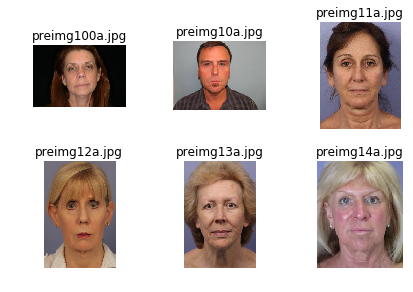

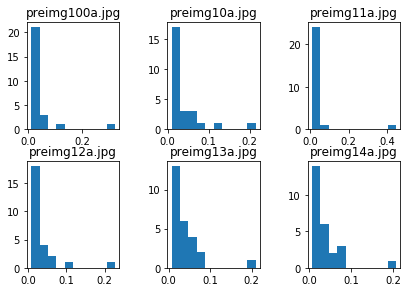

In [12]:
# Display the training images
nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows,ncols)
fig.tight_layout()
for row in range(nrows):
    for col in range(ncols):
        axes[row][col].imshow(plt.imread(X_name[row*ncols+col]))
        axes[row][col].axis('off')
        axes[row][col].set_title("{}".format(os.path.split(X_name[row*ncols+col])[1]))
plt.show()

nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows,ncols)
fig.tight_layout()
for row in range(nrows):
    for col in range(ncols):
        axes[row][col].hist(X_test[row*ncols+col])
        #axes[row][col].imshow(plt.imread(X_name[row*ncols+col]))
        axes[row][col].axis('on')
        axes[row][col].set_title("{}".format(os.path.split(X_name[row*ncols+col])[1]))
plt.show()
        

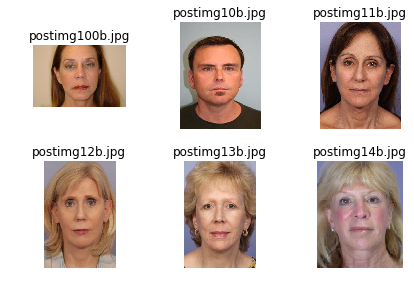

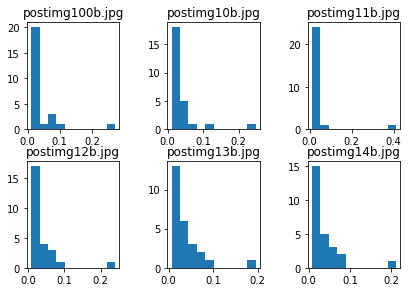

In [13]:
# Display the testing images
nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows,ncols)
fig.tight_layout()
for row in range(nrows):
    for col in range(ncols):
        axes[row][col].imshow(plt.imread(query_name[row*ncols+col]))
        axes[row][col].axis('off')
        axes[row][col].set_title("{}".format(os.path.split(query_name[row*ncols+col])[1]))
plt.show()

nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows,ncols)
fig.tight_layout()
for row in range(nrows):
    for col in range(ncols):
        axes[row][col].hist(query_hist[row*ncols+col])
        #axes[row][col].imshow(plt.imread(X_name[row*ncols+col]))
        axes[row][col].axis('on')
        axes[row][col].set_title("{}".format(os.path.split(query_name[row*ncols+col])[1]))
plt.show()
        

/Users/guneevkaur/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


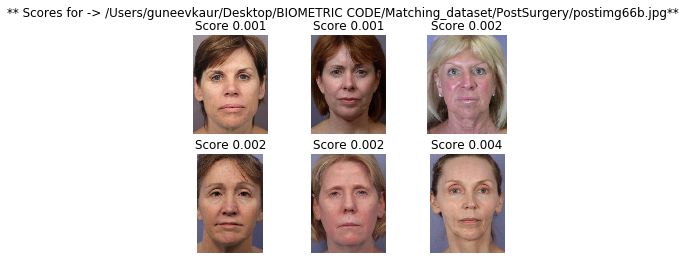

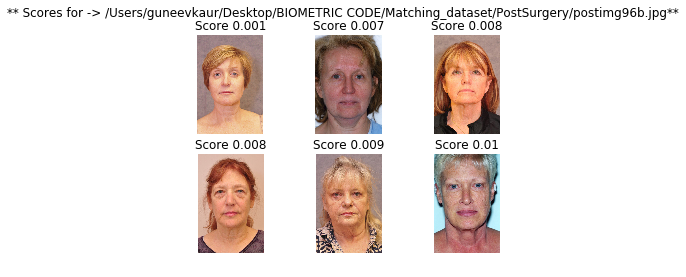

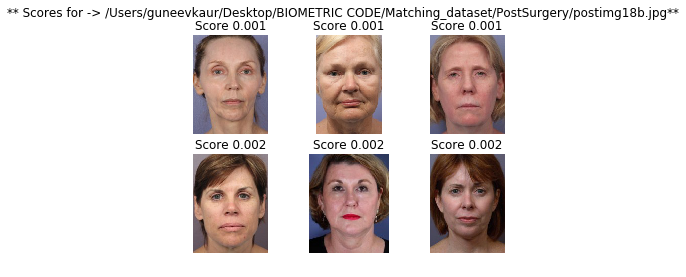

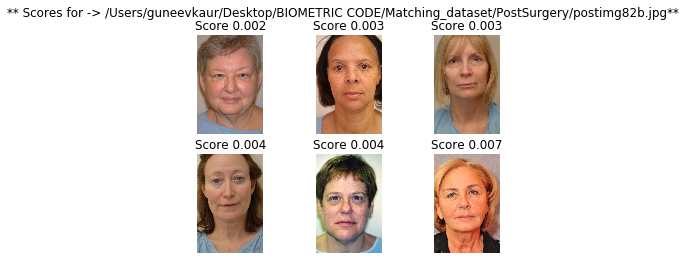

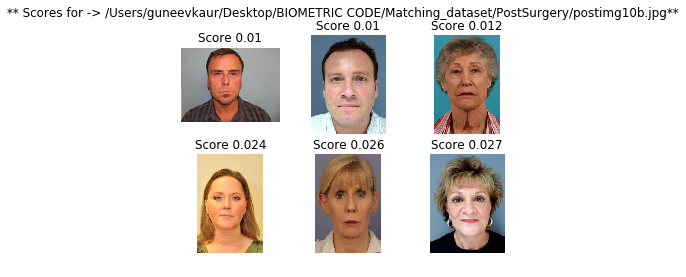

...

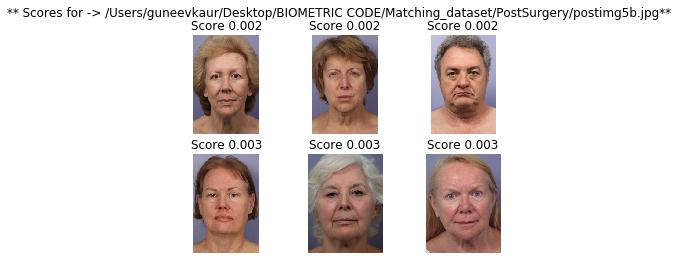

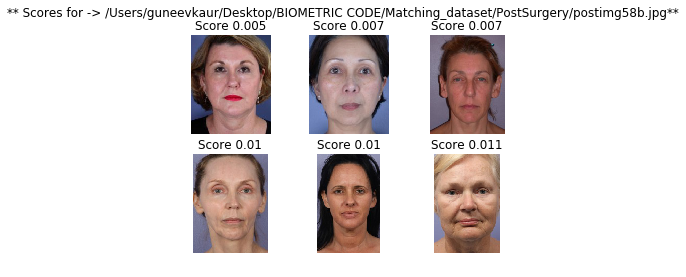

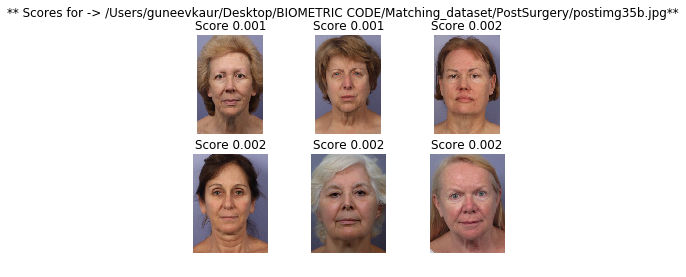

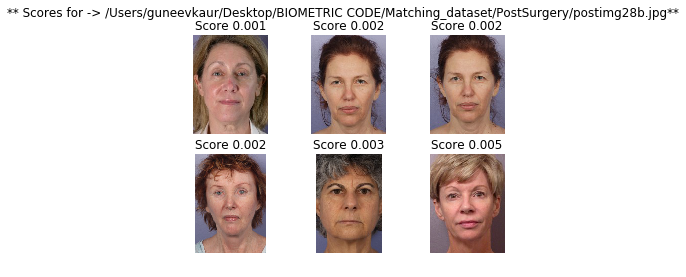

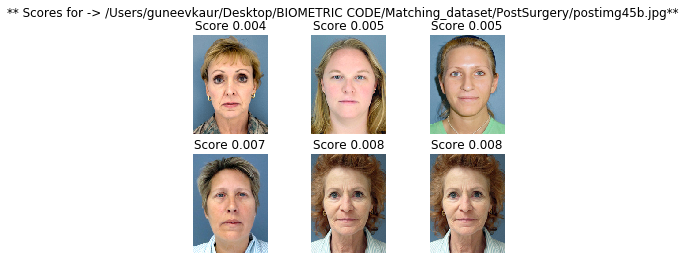

In [14]:
for test_image, results in results_all.items():
    # Read the image
    im = plt.imread(test_image)
    # Display the results
    nrows = 2
    ncols = 3
    fig, axes = plt.subplots(nrows,ncols)
    fig.suptitle("** Scores for -> {}**".format(test_image))
    for row in range(nrows):
        for col in range(ncols):
            axes[row][col].imshow(plt.imread(results[row*ncols+col][0]))
            axes[row][col].axis('off')
            axes[row][col].set_title("Score {}".format(results[row*ncols+col][1]))

plt.show()

In [15]:
#creating test set as x,y for testing the results
test_set_full = {}
train_images.sort()
test_images.sort()
for test_image, train_image in zip(test_images, train_images):
    test_set_full[test_image] = train_image

In [16]:
threshold = 0.001
results_all_keys = sorted(results_all.keys())
l = len(results_all_keys)
correct_predictions = 0
for i in range(l):
    found_flag = 0
    test_image = results_all_keys[i].split('/')[-1]
    test_image = test_image[test_image.find("\\")+1:]
    print test_image
    j = 0
    while found_flag == 0 and j < 1:
        score = results_all[results_all_keys[i]][j][1]
        if score >= threshold:
            prediction = results_all[results_all_keys[i]][j][0].split('/')[-1]
            prediction = prediction[prediction.find("\\")+1:]
            print prediction, score
            if test_set_full[test_image] == prediction:
                #print "correct"
                correct_predictions += 1
            found_flag = 1
        j += 1
print "recognition rate = ", correct_predictions/(l*1.0)

postimg100b.jpg
preimg9a.jpg 0.024
postimg10b.jpg
preimg10a.jpg 0.01
postimg11b.jpg
preimg73a.jpg 0.01
postimg12b.jpg
preimg28a.jpg 0.002
postimg13b.jpg
preimg29a.jpg 0.002
postimg14b.jpg
preimg14a.jpg 0.001
postimg15b.jpg
preimg29a.jpg 0.004
postimg16b.jpg
preimg18a.jpg 0.001
postimg17b.jpg
preimg18a.jpg 0.001
postimg18b.jpg
preimg29a.jpg 0.001
postimg19b.jpg
preimg25a.jpg 0.002
postimg1b.jpg
preimg11a.jpg 0.001
postimg20b.jpg
preimg20a.jpg 0.003
postimg21b.jpg
preimg15a.jpg 0.003
postimg22b.jpg
preimg33a.jpg 0.002
postimg23b.jpg
preimg62a.jpg 0.001
postimg24b.jpg
preimg28a.jpg 0.001
postimg25b.jpg
preimg57a.jpg 0.004
postimg26b.jpg
preimg46a.jpg 0.009
postimg27b.jpg
preimg27a.jpg 0.002
postimg28b.jpg
preimg25a.jpg 0.001
postimg29b.jpg
preimg27a.jpg 0.012
postimg2b.jpg
preimg2a.jpg 0.002
postimg30b.jpg
preimg68a.jpg 0.001
postimg31b.jpg
preimg15a.jpg 0.003
postimg32b.jpg
preimg15a.jpg 0.002
postimg33b.jpg
preimg19a.jpg 0.003
postimg34b.jpg
preimg15a.jpg 0.002
postimg35b.jpg
preimg13a.